In [1]:
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import dash
from dash import dcc, html, Input, Output
import plotly.express as px
import dash_daq as daq
import warnings

In [2]:
file_path = "yellow_tripdata_2016-01.csv"
df = pd.read_csv(file_path, low_memory=False)

df.shape  # Check dataset size
df.head() # Preview data


,VendorID,tpep_pickup_datetime,tpep_dropoff_datetime,passenger_count,trip_distance,pickup_longitude,pickup_latitude,RatecodeID,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,fare_amount,extra,mta_tax,tip_amount,tolls_amount,improvement_surcharge,total_amount
0,2,2016-01-01 00:00:00,2016-01-01 00:00:00,2,1.10,-73.990372,40.734695,1,N,-73.981842,40.732407,2,7.5,0.5,0.5,0.0,0.0,0.3,8.8
1,2,2016-01-01 00:00:00,2016-01-01 00:00:00,5,4.90,-73.980782,40.729912,1,N,-73.944473,40.716679,1,18.0,0.5,0.5,0.0,0.0,0.3,19.3
2,2,2016-01-01 00:00:00,2016-01-01 00:00:00,1,10.54,-73.984550,40.679565,1,N,-73.950272,40.788925,1,33.0,0.5,0.5,0.0,0.0,0.3,34.3
3,2,2016-01-01 00:00:00,2016-01-01 00:00:00,1,4.75,-73.993469,40.718990,1,N,-73.962242,40.657333,2,16.5,0.0,0.5,0.0,0.0,0.3,17.3
4,2,2016-01-01 00:00:00,2016-01-01 00:00:00,3,1.76,-73.960625,40.781330,1,N,-73.977264,40.758514,2,8.0,0.0,0.5,0.0,0.0,0.3,8.8


In [3]:

warnings.filterwarnings("ignore")


In [4]:
df.columns

Index(['VendorID', 'tpep_pickup_datetime', 'tpep_dropoff_datetime',
       'passenger_count', 'trip_distance', 'pickup_longitude',
       'pickup_latitude', 'RatecodeID', 'store_and_fwd_flag',
       'dropoff_longitude', 'dropoff_latitude', 'payment_type', 'fare_amount',
       'extra', 'mta_tax', 'tip_amount', 'tolls_amount',
       'improvement_surcharge', 'total_amount'],
      dtype='object')

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10906858 entries, 0 to 10906857
Data columns (total 19 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   VendorID               int64  
 1   tpep_pickup_datetime   object 
 2   tpep_dropoff_datetime  object 
 3   passenger_count        int64  
 4   trip_distance          float64
 5   pickup_longitude       float64
 6   pickup_latitude        float64
 7   RatecodeID             int64  
 8   store_and_fwd_flag     object 
 9   dropoff_longitude      float64
 10  dropoff_latitude       float64
 11  payment_type           int64  
 12  fare_amount            float64
 13  extra                  float64
 14  mta_tax                float64
 15  tip_amount             float64
 16  tolls_amount           float64
 17  improvement_surcharge  float64
 18  total_amount           float64
dtypes: float64(12), int64(4), object(3)
memory usage: 1.5+ GB


In [6]:
df.isnull().sum()

VendorID                 0
tpep_pickup_datetime     0
tpep_dropoff_datetime    0
passenger_count          0
trip_distance            0
pickup_longitude         0
pickup_latitude          0
RatecodeID               0
store_and_fwd_flag       0
dropoff_longitude        0
dropoff_latitude         0
payment_type             0
fare_amount              0
extra                    0
mta_tax                  0
tip_amount               0
tolls_amount             0
improvement_surcharge    0
total_amount             0
dtype: int64

# Data Analysis

**Vendor Id**
> A code indicating the provider associated with the trip record

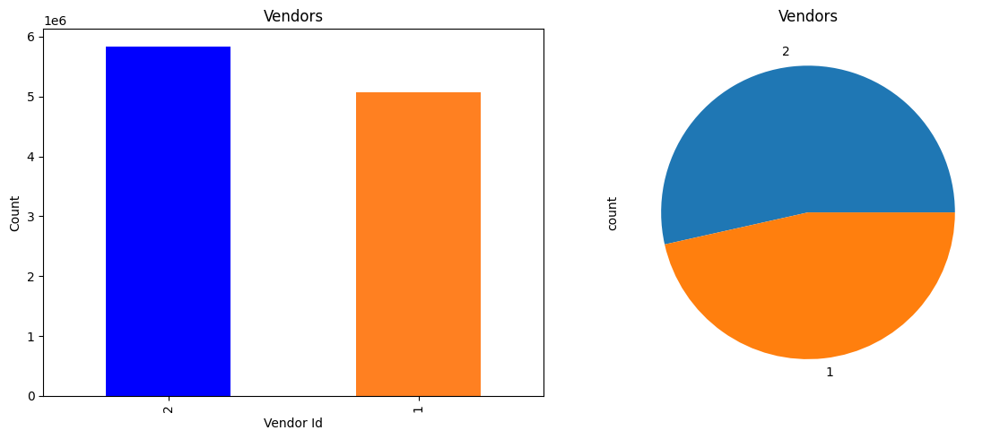

In [7]:
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(12,5))
ax = df['VendorID'].value_counts().plot(kind='bar',title="Vendors",ax=axes[0],color = ('blue',(1, 0.5, 0.13)))
df['VendorID'].value_counts().plot(kind='pie',title="Vendors",ax=axes[1])
ax.set_ylabel("Count")
ax.set_xlabel("Vendor Id")
fig.tight_layout()

* Here we got to know that there are only 2 venders(1 and 2)
* Both the venders share almost equal amount of trips, the difference is quite low between two venders
* But Vendor 2 is evidently more famous among the population as per the above graphs.

**Passengers**
> New York City Taxi Passenger Limit says:

> * A maximum of 4 passengers can ride in traditional cabs.
> * A child under 7 is allowed to sit on a passenger's lap in the rear seat in addition to the passenger limit.

> So, in total we can assume that maximum 5 passenger can board the new york taxi i.e. 4 adult + 1 minor

In [8]:
df['passenger_count'].value_counts()

passenger_count
1    7726984
2    1561977
5     601079
3     436431
6     369155
4     210641
0        520
8         26
9         23
7         22
Name: count, dtype: int64

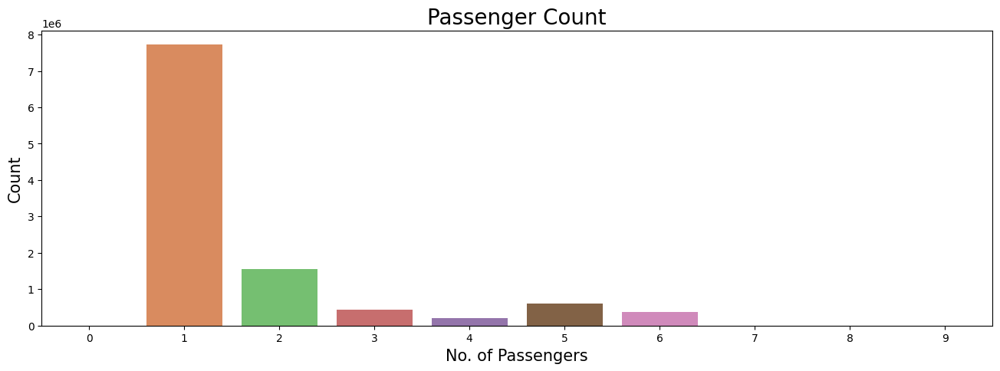

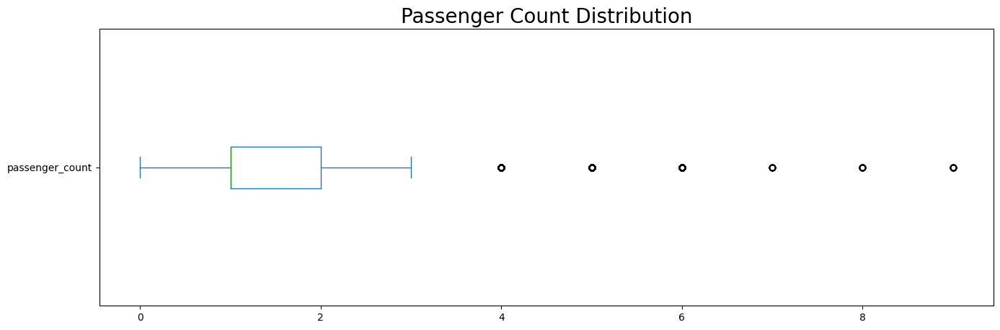

In [9]:
df['passenger_count'] = df['passenger_count'].astype(int)

df = df[df['passenger_count'].notna()]

fig, axes = plt.subplots(nrows=1, ncols=1, figsize=(16, 5))
line = sns.countplot(x=df['passenger_count'], palette="muted")

# Set labels
line.set_ylabel("Count", fontsize=15)
line.set_xlabel("No. of Passengers", fontsize=15)
line.set_title("Passenger Count", fontsize=20)

plt.show()

fig, ax = plt.subplots(figsize=(16, 5))
df['passenger_count'].plot(kind='box', vert=False)

ax.set_title("Passenger Count Distribution", fontsize=20)
plt.show()



* Most of trip consist of passenger either 1 or 2.

**Trip Distance**

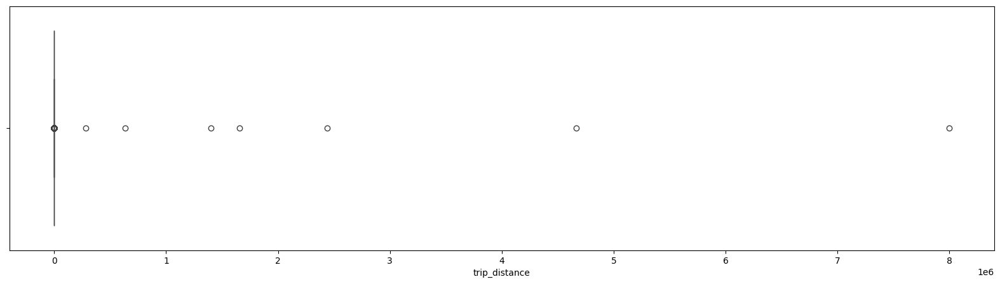

In [10]:
plt.figure(figsize = (20,5))
sns.boxplot(x=df["trip_distance"])
plt.show()

* There some trips with over 60 miles distance.


In [12]:
print(f"There are {df.trip_distance[df.trip_distance == 0 ].count()} trip records with 0 miles distance")

There are 64065 trip records with 0 miles distance


Around 64K trip record with distance equal to 0. Below are some possible explanation for such records.
1. Customer changed mind and cancelled the journey just after accepting it.
2. Software didn't recorded dropoff location properly due to which dropoff location is the same as the pickup location.
3. Issue with GPS tracker while the journey is being finished.
4. Driver cancelled the trip just after accepting it due to some reason. So the trip couldn't start
5. Or some other issue with the software itself which a technical guy can explain

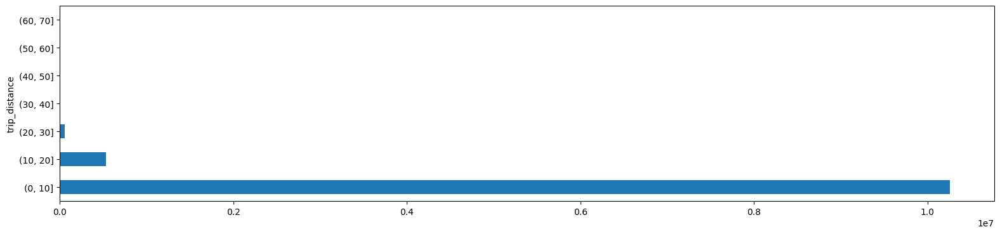

In [11]:
df.trip_distance.groupby(pd.cut(df.trip_distance, np.arange(0,80,10))).count().plot(kind='barh',figsize = (19,4))
plt.show()

From the above observation it is evident that most of the rides are completed between 1-10 miles with some of the rides with distances between 10-30 miles. Other slabs bar are not visible because the number of trips are very less as compared to these slabs

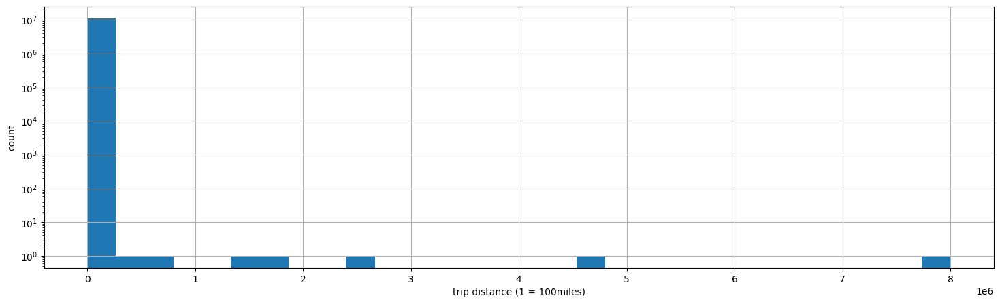

In [16]:
ax = df['trip_distance'].hist(bins=30, figsize=(18,5))
ax.set_yscale('log')
ax.set_xlabel("trip distance (1 = 100miles)")
ax.set_ylabel("count")
plt.show()

In [12]:
df_short = df[df.trip_distance <= 30].count()
df_long = df[df.trip_distance > 30].count()
print(f"Short Trips: {df_short[0]} records in total.\nLong Trips: {df_long[0]} records in total.")

Short Trips: 10903024 records in total.
Long Trips: 3834 records in total.


**Total trips Per Hour**

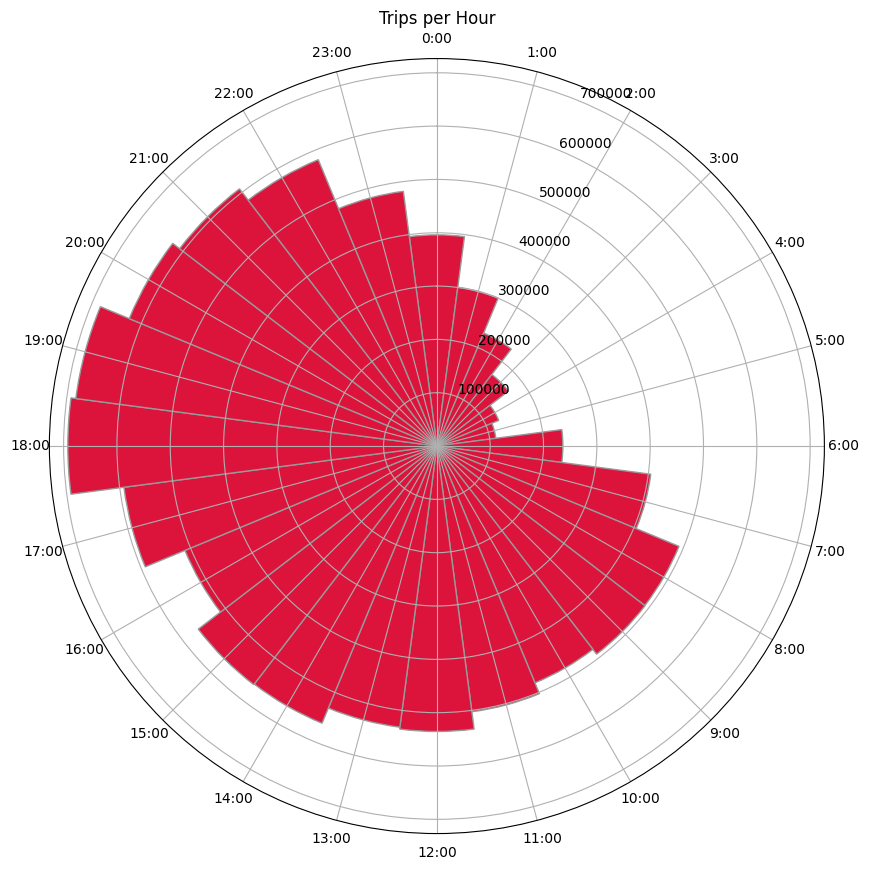

In [14]:
def clock(ax, radii, title, color):
    N = 24
    bottom = 2
    theta = np.linspace(0.0, 2 * np.pi, N, endpoint=False)
    width = (2*np.pi) / N
    bars = ax.bar(theta, radii, width=width, bottom=bottom, color=color, edgecolor="#999999")
    ax.set_theta_zero_location("N")
    ax.set_theta_direction(-1)
    ax.set_xticks(theta)
    ax.set_xticklabels([f"{x}:00" for x in range(24)])
    ax.set_title(title)


df_temp = df.copy()
df_temp['tpep_pickup_datetime'] = pd.to_datetime(df_temp['tpep_pickup_datetime'], errors='coerce')
df_temp['pickup_hour'] = df_temp['tpep_pickup_datetime'].dt.hour

fig, ax = plt.subplots(figsize=(10,10), subplot_kw={'projection': 'polar'})
radii = np.zeros(24, dtype="int64")
pickup_counts = df_temp['pickup_hour'].value_counts(sort=False)
radii[pickup_counts.index] = pickup_counts.values
clock(ax, radii, "Trips per Hour", "#dc143c")
plt.subplots_adjust(top=0.9, bottom=0.1)
plt.show()


It's inline with the general trend of taxi pickups which starts increasing from 6AM in the morning and then declines from late evening i.e. around 8 PM. There is no unusual behavior here.
The number of pickup is maximum at 6-7 pm.

**Trip Duration per hour**

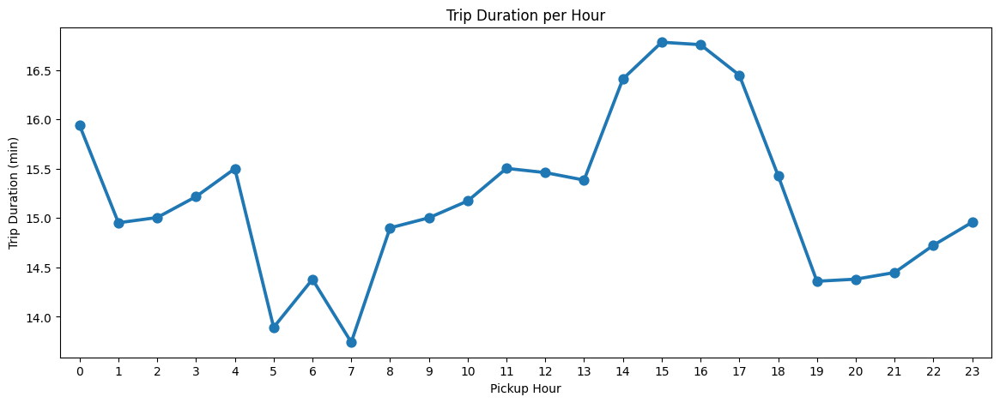

In [15]:
df_temp['tpep_pickup_datetime'] = pd.to_datetime(df_temp['tpep_pickup_datetime'], errors='coerce')
df_temp['tpep_dropoff_datetime'] = pd.to_datetime(df_temp['tpep_dropoff_datetime'], errors='coerce')

df_temp['trip_duration'] = (df_temp['tpep_dropoff_datetime'] - df_temp['tpep_pickup_datetime']).dt.total_seconds() / 60

plt.figure(figsize = (14,5))
group1 = df_temp.groupby('pickup_hour').trip_duration.mean()
sns.pointplot(x=group1.index, y=group1.values)
plt.ylabel('Trip Duration (min)')
plt.xlabel('Pickup Hour')
plt.title('Trip Duration per Hour')
plt.show()


* Average trip duration is lowest at 7 AM when there is minimal traffic on the roads.
* Average trip duration is generally highest around 3 PM during the busy streets.
* Trip duration on an average is similar during early morning hours i.e. before 7 AM & late evening hours i.e. after 6 PM.

**Distance per Hour**

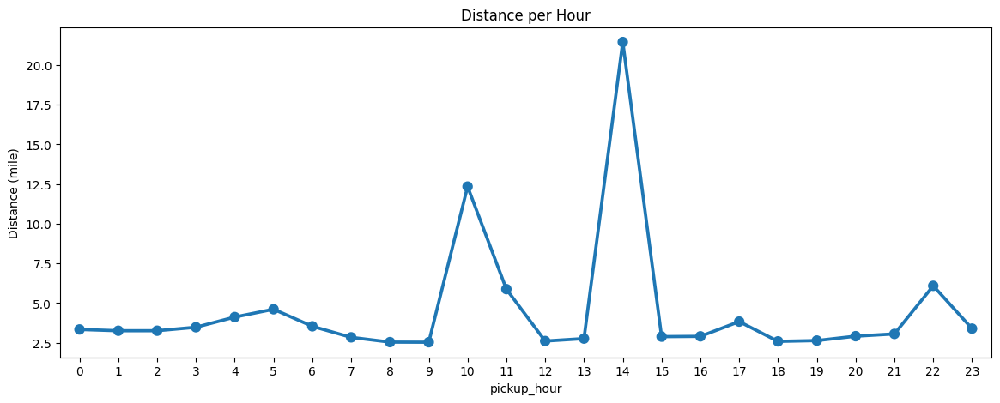

In [30]:
plt.figure(figsize = (14,5))
group5 = df_temp.groupby('pickup_hour').trip_distance.mean()
sns.pointplot(x=group5.index, y=group5.values)
plt.ylabel('Distance (mile)')
plt.title('Distance per Hour')
plt.show()

* Trip distance is highest during noon hours.
* Trip distance is fairly equal from morning till the evening varying around 2.5 - 5 mile.

**Pick Up Points v/s Dropoff Points**
> Here we take a look at the spread of Pickup co-ordinates and Drop-off co-ordinates across city

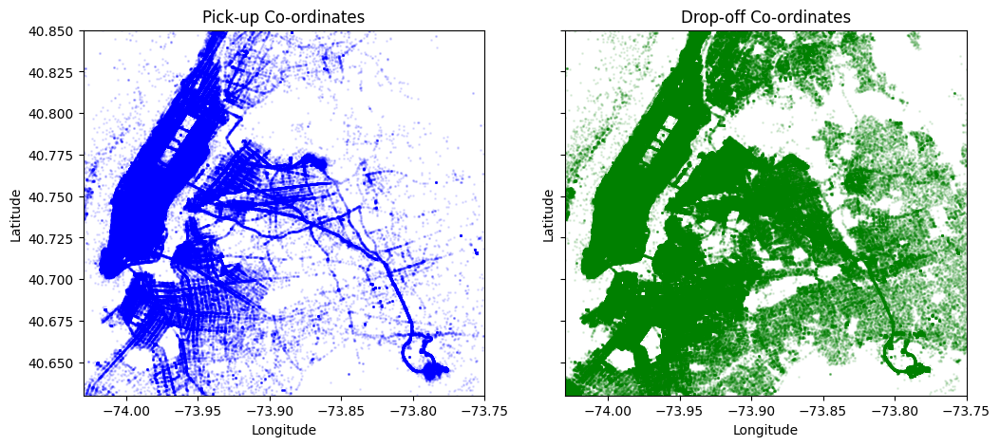

In [31]:
city_long_border = (-74.03, -73.75)
city_lat_border = (40.63, 40.85)
fig, ax = plt.subplots(ncols=2, sharex=True, sharey=True,figsize = (12,5))
ax[0].scatter(df['pickup_longitude'].values, df['pickup_latitude'].values,
color='blue', s=1, label='train', alpha=0.1)
ax[1].scatter(df['dropoff_longitude'].values, df['dropoff_latitude'].values,
color='green', s=1, label='train', alpha=0.1)
ax[1].set_title('Drop-off Co-ordinates')
ax[0].set_title('Pick-up Co-ordinates')
ax[0].set_ylabel('Latitude')
ax[0].set_xlabel('Longitude')
ax[1].set_ylabel('Latitude')
ax[1].set_xlabel('Longitude')
plt.ylim(city_lat_border)
plt.xlim(city_long_border)
plt.show()

* In the Pickup plot we can see the spread is mostly concentrated on Manhattan area.
* We can say Manhattan is quite populated for a pickup spot.
* Whereas the drop zone is quite spreaded out compared to pickup.

**Clustering**

In [7]:
from sklearn.cluster import MiniBatchKMeans

# Filter dataset to remove outliers and missing values
df_clean = df.dropna(subset=['pickup_latitude', 'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude'])

df_clean = df_clean[
    (df_clean['pickup_latitude'].between(40.5, 41)) &  
    (df_clean['pickup_longitude'].between(-74.3, -73.7)) &
    (df_clean['dropoff_latitude'].between(40.5, 41)) &  
    (df_clean['dropoff_longitude'].between(-74.3, -73.7))
]

print(f"Filtered dataset size: {df_clean.shape}")

Filtered dataset size: (10713544, 19)


In [8]:
df_sample = df_clean.sample(n=100000, random_state=42)

# Perform clustering for both Pickup & Dropoff locations
NUM_CLUSTERS = 10  

kmeans_pickup = MiniBatchKMeans(n_clusters=NUM_CLUSTERS, random_state=42, batch_size=10000)
df_clean['pickup_cluster'] = kmeans_pickup.fit_predict(df_clean[['pickup_latitude', 'pickup_longitude']])

kmeans_dropoff = MiniBatchKMeans(n_clusters=NUM_CLUSTERS, random_state=42, batch_size=10000)
df_clean['dropoff_cluster'] = kmeans_dropoff.fit_predict(df_clean[['dropoff_latitude', 'dropoff_longitude']])

# Merge the new cluster labels back into the original dataframe
df = df.merge(df_clean[['pickup_latitude', 'pickup_longitude', 'pickup_cluster',
                         'dropoff_latitude', 'dropoff_longitude', 'dropoff_cluster']],
              on=['pickup_latitude', 'pickup_longitude', 'dropoff_latitude', 'dropoff_longitude'],
              how='left')


In [9]:
df[['pickup_latitude', 'pickup_longitude', 'pickup_cluster', 
          'dropoff_latitude', 'dropoff_longitude', 'dropoff_cluster']].head()

,pickup_latitude,pickup_longitude,pickup_cluster,dropoff_latitude,dropoff_longitude,dropoff_cluster
0,40.734695,-73.990372,6.0,40.732407,-73.981842,0.0
1,40.729912,-73.980782,8.0,40.716679,-73.944473,5.0
2,40.679565,-73.984550,0.0,40.788925,-73.950272,8.0
3,40.718990,-73.993469,6.0,40.657333,-73.962242,7.0
4,40.781330,-73.960625,1.0,40.758514,-73.977264,9.0


/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


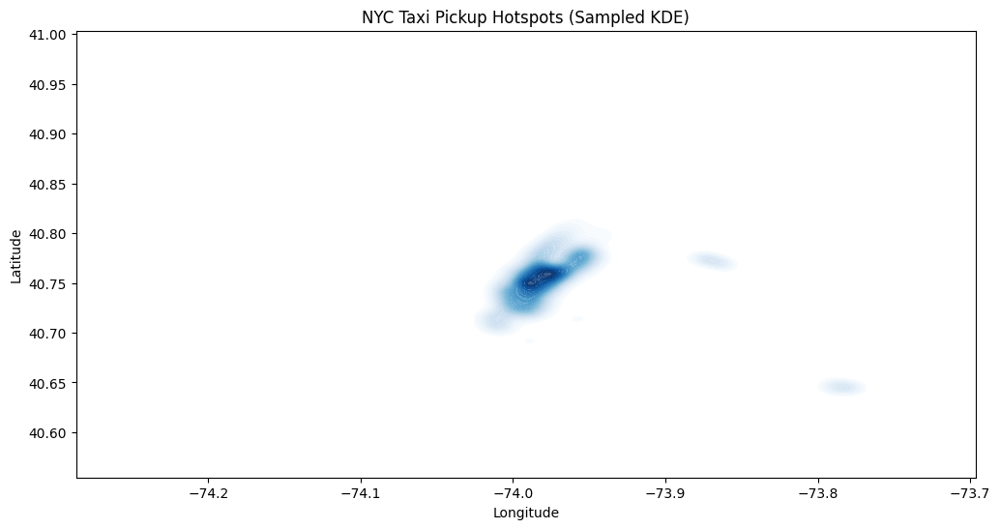

In [35]:
plt.figure(figsize=(12,6))
sns.kdeplot(
    x=df_sample['pickup_longitude'], 
    y=df_sample['pickup_latitude'], 
    cmap="Blues", fill=True, alpha=0.8, levels=50
)
plt.title("NYC Taxi Pickup Hotspots (Sampled KDE)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.show()


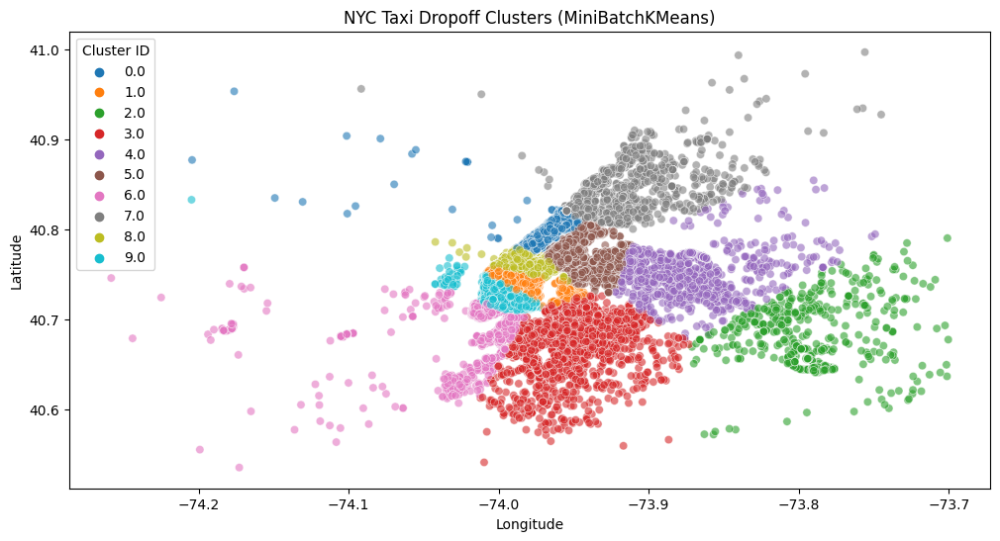

In [12]:
plt.figure(figsize=(12,6))

df_plot = df.sample(n=100000, random_state=42)

sns.scatterplot(
    x=df_plot['dropoff_longitude'], 
    y=df_plot['dropoff_latitude'], 
    hue=df_plot['dropoff_cluster'], 
    palette="tab10", alpha=0.6
)
plt.title("NYC Taxi Dropoff Clusters (MiniBatchKMeans)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Cluster ID")
plt.show()


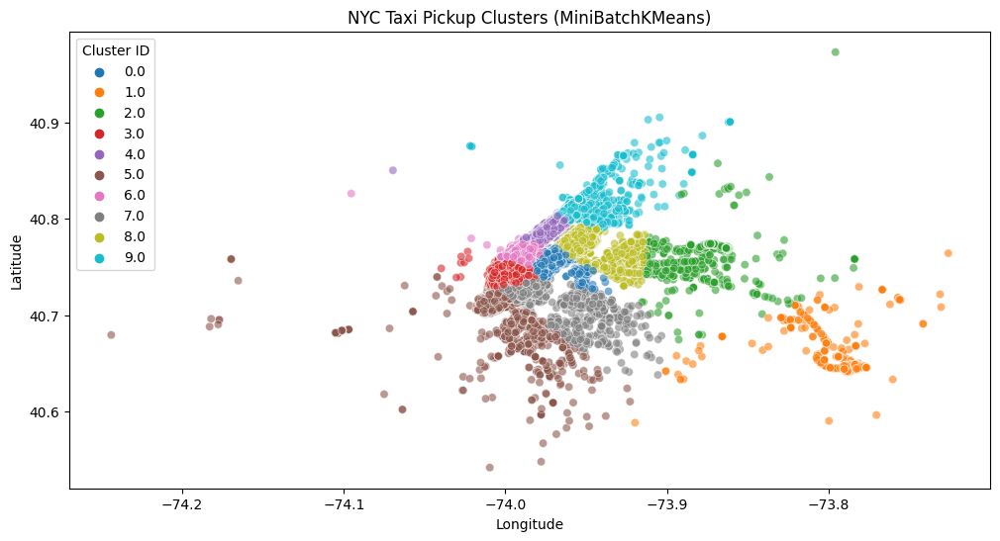

In [11]:
plt.figure(figsize=(12,6))

# Sample for scatter plot (100,000 points)
df_plot = df.sample(n=100000, random_state=42)

sns.scatterplot(
    x=df_plot['pickup_longitude'], 
    y=df_plot['pickup_latitude'], 
    hue=df_plot['pickup_cluster'], 
    palette="tab10", alpha=0.6
)

plt.title("NYC Taxi Pickup Clusters (MiniBatchKMeans)")
plt.xlabel("Longitude")
plt.ylabel("Latitude")
plt.legend(title="Cluster ID")
plt.show()


# Convert timestamps to datetime format

**Cleaning our Dataset**

In [10]:
# Convert column names to lowercase for consistency
df.columns = df.columns.str.lower()

# Drop duplicates and NaN values
df.drop_duplicates(inplace=True)
df.dropna(inplace=True)

# Ensure `fare_amount` and `trip_distance` are positive
df = df[(df['fare_amount'] > 0) & (df['trip_distance'] > 0)]

# Remove invalid passenger counts
df = df[df['passenger_count'] >= 1]

df['store_and_fwd_flag'] = (df['store_and_fwd_flag'] == 'Y').astype(int)

# Convert timestamps to datetime format
df['tpep_pickup_datetime'] = pd.to_datetime(df['tpep_pickup_datetime'], errors='coerce')
df['tpep_dropoff_datetime'] = pd.to_datetime(df['tpep_dropoff_datetime'], errors='coerce')

# Remove trips where pickup is after dropoff
df = df[df['tpep_pickup_datetime'] < df['tpep_dropoff_datetime']]

# Remove unrealistic dates (before 2000 or in the future)
df = df[(df['tpep_pickup_datetime'].dt.year >= 2000) & (df['tpep_pickup_datetime'].dt.year <= 2025)]

# Fill missing `ratecodeid` with 1 (Standard Rate)
df['ratecodeid'].fillna(1, inplace=True)

print(f"Cleaned data shape: {df.shape}")


Cleaned data shape: (10668480, 21)


**Calulating Trip Duration Feature**

In [11]:
# Trip duration in minutes
df['trip_duration'] = (df['tpep_dropoff_datetime'] - df['tpep_pickup_datetime']).dt.total_seconds() / 60

# Hour and day of pickup
df['pickup_hour'] = df['tpep_pickup_datetime'].dt.hour
df['pickup_dayofweek'] = df['tpep_pickup_datetime'].dt.dayofweek # 0 = Monday, 6 = Sunday
df['weekday_num'] = df['tpep_pickup_datetime'].dt.weekday
df = df.drop(columns=['tpep_pickup_datetime', 'tpep_dropoff_datetime'])
# Preview new columns
df[['trip_duration', 'pickup_hour', 'weekday_num', 'pickup_dayofweek']].head()


,trip_duration,pickup_hour,weekday_num,pickup_dayofweek
5,18.50,0,4,4
6,26.75,0,4,4
7,11.90,0,4,4
8,11.20,0,4,4
9,11.10,0,4,4


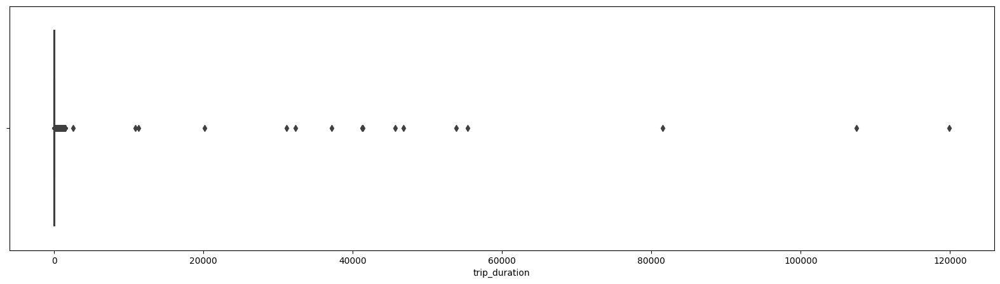

In [18]:
plt.figure(figsize = (20,5))
sns.boxplot(x=df['trip_duration'])
plt.show()

There are some durations with as low as 1 second. which points towards trips with 0 km distance.

**Distance v/s Trip duration**

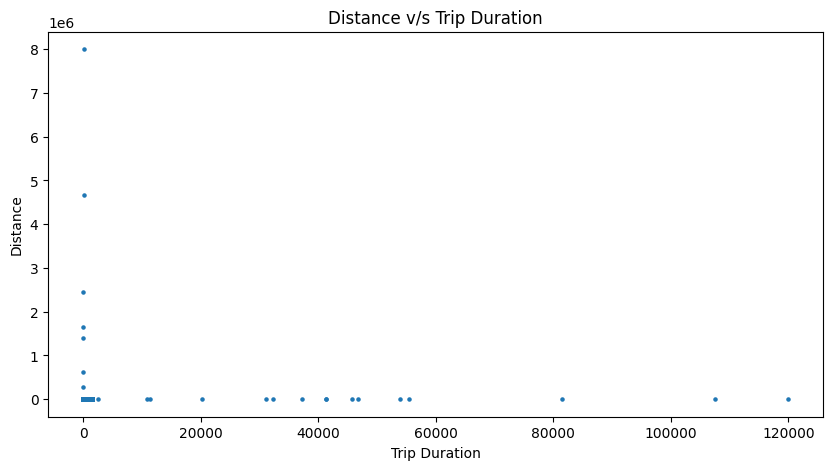

In [26]:
plt.figure(figsize = (10,5))
plt.scatter(df.trip_duration, df.trip_distance , s=5, alpha=1)
plt.ylabel('Distance')
plt.xlabel('Trip Duration')
plt.title('Distance v/s Trip Duration')
plt.show()

# Compute Mean Trip Duration & Total Trip Count per Hour

In [13]:
hourly_trips = df.groupby('pickup_hour').agg(
    avg_trip_duration=('trip_duration', 'mean'),
    total_trips=('trip_distance', 'count')
).reset_index()

hourly_trips.head()


,pickup_hour,avg_trip_duration,total_trips
0,0,16.035169,386752
1,1,15.014190,293055
2,2,15.117131,223498
3,3,15.323979,164547
4,4,15.712999,121722


In [14]:
pivot_table = df.pivot_table(
    values='trip_duration', 
    index='pickup_dayofweek', 
    columns='pickup_hour', 
    aggfunc='mean'
)

pivot_table


pickup_hour,0,1,2,3,4,5,6,7,8,9,...,14,15,16,17,18,19,20,21,22,23
pickup_dayofweek,,,,,,,,,,,,,,,,,,,,,
0,13.900741,13.935003,14.079569,14.245668,14.829137,13.885090,13.535343,14.904476,15.689169,15.790036,...,16.152895,16.526647,16.372305,15.778845,14.911985,12.914804,13.490473,13.219849,13.904541,14.590809
1,24.990002,13.150200,14.215781,14.166166,15.538132,13.285532,22.552809,14.027927,15.886283,16.689998,...,17.734546,17.831913,17.810593,17.504890,15.960275,14.015823,14.014434,13.791726,14.308457,14.044908
2,14.078346,12.617396,13.033190,13.820124,14.391258,12.179444,11.830302,13.872032,15.591668,16.570800,...,17.511041,17.854613,17.443577,16.554204,15.512562,13.861327,14.079229,14.042186,14.318151,14.177523
3,14.464473,13.460672,13.813441,13.969350,14.635342,12.670732,11.842235,13.651670,15.271595,15.788870,...,17.657619,18.543759,17.442555,17.379506,15.992665,14.722645,14.665091,15.121957,15.289580,14.942738
4,16.080252,15.724747,15.766685,16.329573,16.773638,14.754417,12.862304,13.716827,15.242213,15.309578,...,16.664085,17.104937,17.057798,16.433584,15.396567,14.887321,15.119943,15.029041,15.389944,16.034511
5,16.059267,16.000679,15.878656,15.356894,15.952637,16.132312,14.171015,12.265718,11.630903,11.513795,...,14.880417,15.037319,15.659862,15.776347,15.340872,15.737267,15.372861,15.609010,15.560462,15.732889
6,15.031233,15.130625,14.906415,15.421692,15.518910,15.316451,14.648360,12.414224,11.240458,10.980527,...,15.129512,15.492925,16.342200,16.368030,15.269905,14.469579,14.118081,14.254260,13.778790,14.023693


# Create a simulated weather dataset

In [12]:
weather_data = pd.DataFrame({
    'hour': np.arange(0, 24),
    'temperature': np.random.randint(25, 35, 24),  # Fake temp (Celsius)
    'precipitation': np.random.uniform(0, 10, 24)  # Fake rainfall (mm)
})

weather_data


,hour,temperature,precipitation
0,0,30,7.218074
1,1,30,8.177548
2,2,29,3.964084
3,3,28,0.199942
4,4,34,4.474877
5,5,34,0.262683
6,6,30,8.026832
7,7,27,7.302999
8,8,28,1.312897
9,9,33,8.908231


# Merge with hourly stats

In [15]:
df = df.merge(weather_data, left_on='pickup_hour', right_on='hour', how='left')
df.drop(columns=['hour'], inplace=True)

df[['pickup_hour', 'temperature', 'precipitation']].head()


,pickup_hour,temperature,precipitation
0,0,30,7.218074
1,0,30,7.218074
2,0,30,7.218074
3,0,30,7.218074
4,0,30,7.218074


# Time-Series Plot (Trips Over Hours)

In [16]:
import plotly.express as px

fig = px.line(hourly_trips, x='pickup_hour', y='total_trips', title="Total Trips by Hour of Day")
fig.show()

**Calculating speed Feature**

> Speed is a function of distance and time. Let's visualize speed in different trips.

> Maximum speed limit in NYC is as follows:

> * 25 mph in urban area
> * 65 mph on controlled state highways

In [17]:
df['speed'] = (df.trip_distance/(df.trip_duration/60))



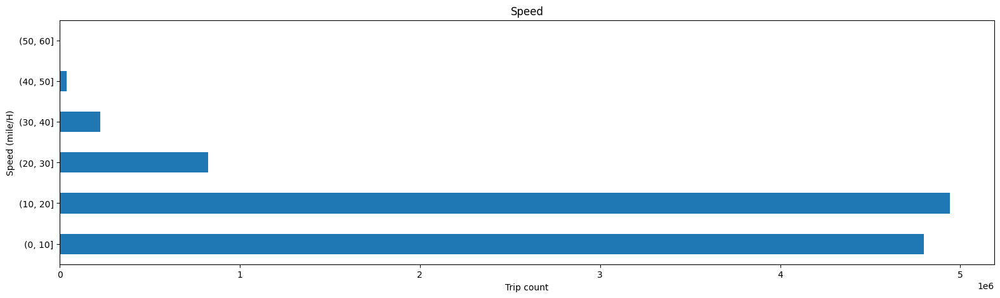

In [24]:
df = df[df.speed <= 65]
df.speed.groupby(pd.cut(df.speed, np.arange(0,65,10))).count().plot(kind = 'barh',figsize = (19,5))
plt.xlabel('Trip count')
plt.ylabel('Speed (mile/H)')
plt.title('Speed')
plt.show()

* It is evident from this graph what we thought off i.e. most of the trips were done at a speed range of 10-20 miles/H.

In [18]:
# Define rush hour conditions
weekdays = df['pickup_dayofweek'] < 5  # Monday to Friday
weekend = df['pickup_dayofweek'] >= 5  # Saturday & Sunday

morning_rush = (df['pickup_hour'] >= 7) & (df['pickup_hour'] <= 9)
evening_rush_weekday = (df['pickup_hour'] >= 16) & (df['pickup_hour'] <= 19)
evening_rush_weekend = (df['pickup_hour'] >= 16) & (df['pickup_hour'] <= 20)

# Computing rush hour flag using vectorized logic
df['rush_hour'] = np.where(
    (weekdays & (morning_rush | evening_rush_weekday)) | (weekend & evening_rush_weekend), 
    1, 
    0
)


In [19]:
df['rush_hour'] = df['rush_hour'].astype('int8')
df['rush_hour'].value_counts()


rush_hour
0    6942949
1    3725531
Name: count, dtype: int64

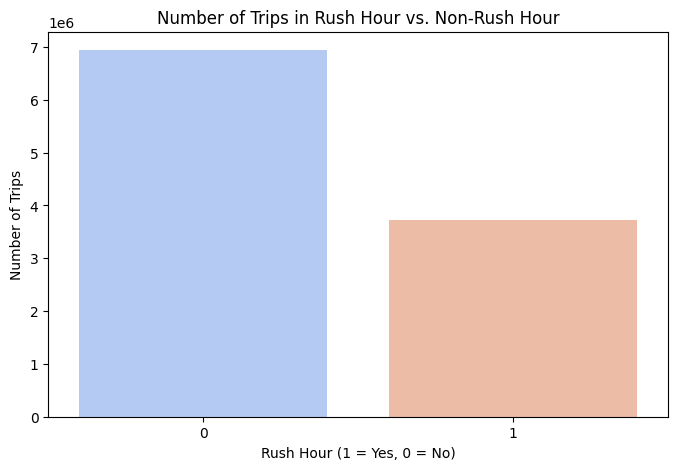

In [21]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8,5))
sns.countplot(x=df['rush_hour'], palette="coolwarm")

plt.title("Number of Trips in Rush Hour vs. Non-Rush Hour")
plt.xlabel("Rush Hour (1 = Yes, 0 = No)")
plt.ylabel("Number of Trips")
plt.show()


# Heatmap (Trip Duration by Day & Hour)

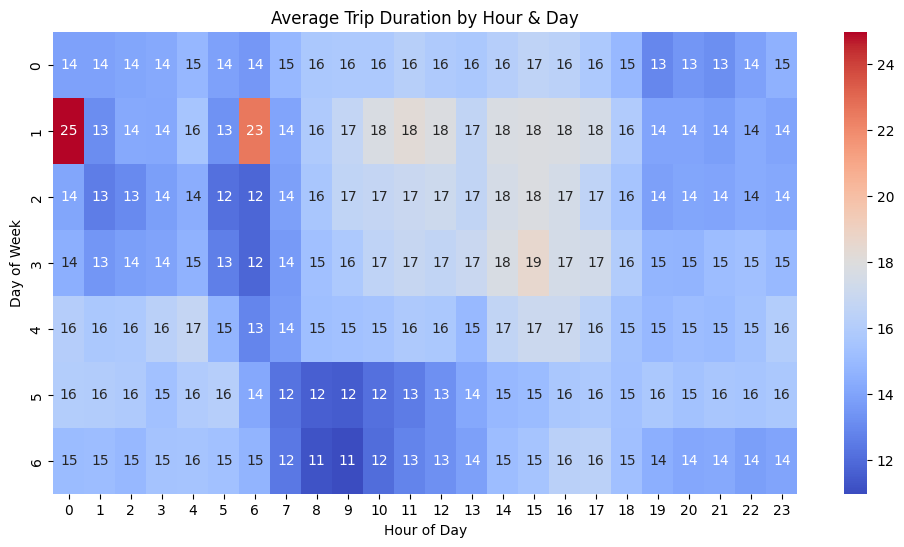

In [36]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(12,6))
sns.heatmap(pivot_table, cmap="coolwarm", annot=True)
plt.title("Average Trip Duration by Hour & Day")
plt.xlabel("Hour of Day")
plt.ylabel("Day of Week")
plt.show()


# Replacing Loops with NumPy Vectorized Computation

In [28]:
import time

def calculate_speed(row):
    """Calculate speed in mph using a loop-based approach."""
    if row['trip_duration'] > 0:
        return row['trip_distance'] / (row['trip_duration'] / 60)  # Speed = Distance / Time
    else:
        return 0

start_time = time.time()

# Apply function 
df.apply(calculate_speed, axis=1)

end_time = time.time()
print(f"Loop-Based Execution Time: {end_time - start_time:.2f} seconds")


Loop-Based Execution Time: 40.87 seconds


In [29]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 10827774 entries, 0 to 10837006
Data columns (total 25 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   vendorid               int64  
 1   passenger_count        int64  
 2   trip_distance          float64
 3   pickup_longitude       float64
 4   pickup_latitude        float64
 5   ratecodeid             int64  
 6   store_and_fwd_flag     int64  
 7   dropoff_longitude      float64
 8   dropoff_latitude       float64
 9   payment_type           int64  
 10  fare_amount            float64
 11  extra                  float64
 12  mta_tax                float64
 13  tip_amount             float64
 14  tolls_amount           float64
 15  improvement_surcharge  float64
 16  total_amount           float64
 17  trip_duration          float64
 18  pickup_hour            int32  
 19  pickup_dayofweek       int32  
 20  weekday_num            int32  
 21  temperature            int64  
 22  precipitation        

# Vectorized approach (faster)

In [30]:
import numpy as np

chunk_size = 500000  # Process dataset in chunks

def process_chunk(chunk):
    chunk['speed_mph'] = np.where(
        chunk['trip_duration'] > 0, chunk['trip_distance'] / (chunk['trip_duration'] / 60), 0
    )
    return chunk


In [31]:
import time

start_time = time.time()  # Start timing

chunks = []  # List to store processed chunks
for i in range(0, len(df), chunk_size):
    chunk = df.iloc[i:i+chunk_size].copy()
    chunk = process_chunk(chunk)
    chunks.append(chunk)


df = pd.concat(chunks, ignore_index=True)

end_time = time.time()
print(f"Vectorized Computation Completed in: {end_time - start_time:.2f} seconds")


Vectorized Computation Completed in: 2.17 seconds



**Loop Execution Time: 40.19 seconds (approx)**



**Vectorized Execution Time: 3.22 seconds (approx)**

# Define the Risk Score Function

Compute a Risk Score based on:
* Long trip durations (> 1 hour)
* Short trips with unusually long times
* High fares for short distances

2 = High Risk, 1 = Medium Risk, 0 = Low Risk

In [20]:
# Define risk conditions using vectorized NumPy operations
high_risk_condition_1 = df['trip_duration'] > 60
medium_risk_condition = (df['trip_distance'] < 1) & (df['trip_duration'] > 15)
high_risk_condition_2 = (df['fare_amount'] > 100) & (df['trip_distance'] < 5)

# Assign risk levels using np.select()
conditions = [high_risk_condition_1, medium_risk_condition, high_risk_condition_2]
choices = [2,1,2]

df['risk_score'] = np.select(conditions, choices, default=0)



In [21]:
df['risk_score'].value_counts()

risk_score
0    10568064
2       72412
1       28004
Name: count, dtype: int64

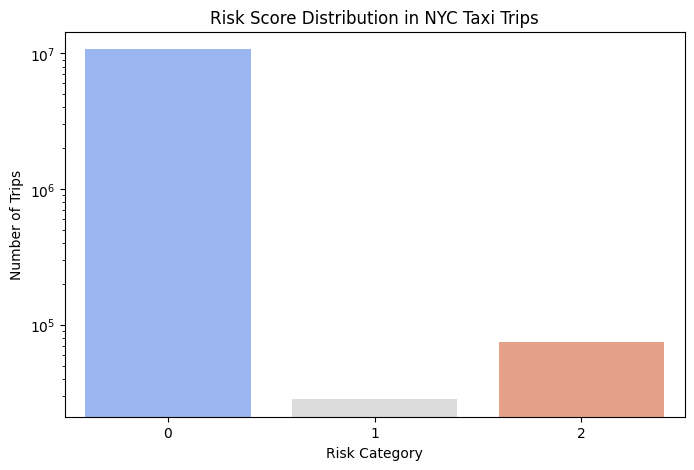

In [34]:
plt.figure(figsize=(8,5))
sns.countplot(x=df['risk_score'], palette="coolwarm")
plt.yscale("log")
plt.title("Risk Score Distribution in NYC Taxi Trips")
plt.xlabel("Risk Category")
plt.ylabel("Number of Trips")
plt.show()


# Scatter Plot: Trip Duration vs. Trip Distance (Color-Coded by Risk Score)

In [24]:
import plotly.express as px

fig = px.scatter(
    df.sample(10000),  # Sample 10K points to avoid overloading
    x="trip_duration",
    y="trip_distance",
    color="risk_score",
    title="Trip Duration vs. Trip Distance (Colored by Risk Score)",
    labels={"trip_duration": "Trip Duration (mins)", "trip_distance": "Trip Distance (miles)"},
    opacity=0.5
)


fig.update_layout(
    width=1200,  
    height=600,  
    xaxis=dict(range=[0, 200]), 
    yaxis=dict(range=[0, 30])  
)

fig.show()


# KDE Plot: Distribution of Trip Duration by Risk Score

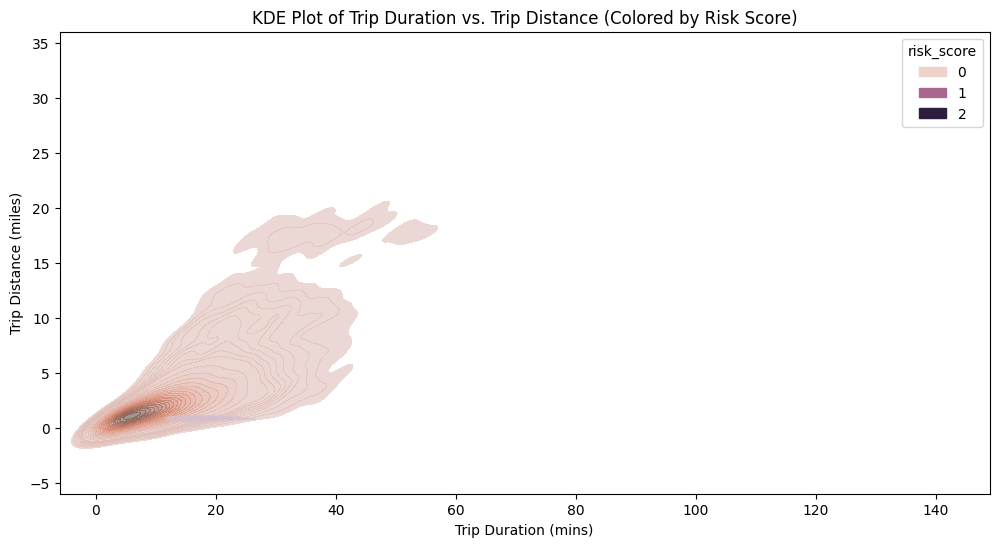

In [41]:
df_filtered = df[(df["trip_duration"] > 0) & (df["trip_duration"] < 200) & (df["trip_distance"] < 30)]
plt.figure(figsize=(12, 6))

sns.kdeplot(
    data=df_filtered.sample(10000),
    x="trip_duration",
    y="trip_distance",
    hue="risk_score",  
    fill=True,  
    cmap="magma", 
    levels=30,  
    alpha=0.6  
)

# Labels and title
plt.xlabel("Trip Duration (mins)")
plt.ylabel("Trip Distance (miles)")
plt.title("KDE Plot of Trip Duration vs. Trip Distance (Colored by Risk Score)")

plt.show()

# Trip Duration Prediction 
Since trip duration depends on various factors (trip distance, time of day, etc.), we can use Linear Regression to predict trip duration.

In [22]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10668480 entries, 0 to 10668479
Data columns (total 28 columns):
 #   Column                 Dtype  
---  ------                 -----  
 0   vendorid               int64  
 1   passenger_count        int64  
 2   trip_distance          float64
 3   pickup_longitude       float64
 4   pickup_latitude        float64
 5   ratecodeid             int64  
 6   store_and_fwd_flag     int64  
 7   dropoff_longitude      float64
 8   dropoff_latitude       float64
 9   payment_type           int64  
 10  fare_amount            float64
 11  extra                  float64
 12  mta_tax                float64
 13  tip_amount             float64
 14  tolls_amount           float64
 15  improvement_surcharge  float64
 16  total_amount           float64
 17  pickup_cluster         float64
 18  dropoff_cluster        float64
 19  trip_duration          float64
 20  pickup_hour            int32  
 21  pickup_dayofweek       int32  
 22  weekday_num     

In [23]:
def remove_outliers(df, column):
    Q1 = df[column].quantile(0.25)
    Q3 = df[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return df[(df[column] >= lower_bound) & (df[column] <= upper_bound)]

# Apply outlier removal on speed, trip_distance, and trip_duration
df_filtered = df.copy()
for col in ["speed", "trip_distance", "trip_duration"]:
    df_filtered = remove_outliers(df_filtered, col)

df_filtered.head()

,vendorid,passenger_count,trip_distance,pickup_longitude,pickup_latitude,ratecodeid,store_and_fwd_flag,dropoff_longitude,dropoff_latitude,payment_type,...,dropoff_cluster,trip_duration,pickup_hour,pickup_dayofweek,weekday_num,temperature,precipitation,speed,rush_hour,risk_score
2,1,1,1.20,-73.979424,40.744614,1,0,-73.992035,40.753944,2,...,0.0,11.900000,0,4,4,30,7.218074,6.050420,0,0
4,2,1,3.21,-73.998344,40.723896,1,0,-73.995850,40.688400,2,...,7.0,11.100000,0,4,4,30,7.218074,17.351351,0,0
5,2,1,0.79,-74.006149,40.744919,1,0,-73.993797,40.741440,2,...,0.0,6.266667,0,4,4,30,7.218074,7.563830,0,0
6,2,6,2.43,-73.969330,40.763538,1,0,-73.995689,40.744251,1,...,0.0,15.766667,0,4,4,30,7.218074,9.247357,0,0
7,2,4,0.01,-73.989021,40.721539,1,0,-73.988960,40.721699,2,...,6.0,0.133333,0,4,4,30,7.218074,4.500000,0,0


In [24]:
from sklearn.model_selection import train_test_split
df = df.dropna()
x = df_filtered.iloc[:,[0, 1, 2, 16, 25, 18, 26]].values
y = df_filtered.iloc[:,19].values
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.2,random_state = 42)

In [25]:
from scipy.stats import pearsonr
df1 = pd.DataFrame(np.concatenate((x_train,y_train.reshape(len(y_train),1)),axis=1))
df1.columns = df1.columns.astype(str)

features = df1.iloc[:,:6].columns.tolist()
target = df1.iloc[:,6].name

correlations = {}
for f in features:
    data_temp = df1[[f,target]]
    x1 = data_temp[f].values
    x2 = data_temp[target].values
    key = f + ' vs ' + target
    correlations[key] = pearsonr(x1,x2)[0]
    
data_correlations = pd.DataFrame(correlations, index=['Value']).T
data_correlations.loc[data_correlations['Value'].abs().sort_values(ascending=False).index]

,Value
4 vs 6,-0.165812
2 vs 6,-0.065936
5 vs 6,0.015617
1 vs 6,-0.010534
0 vs 6,0.004505
3 vs 6,0.001740


In [26]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

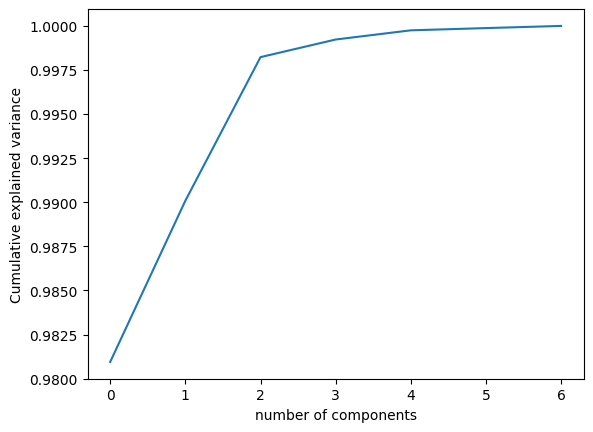

In [27]:
from sklearn.decomposition import PCA
pca = PCA().fit(x_train)
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel("number of components")
plt.ylabel("Cumulative explained variance")
plt.show()

In [28]:
arr = np.cumsum(np.round(pca.explained_variance_ratio_, decimals=4)*100)
list(zip(range(1,len(arr)), arr))


[(1, np.float64(98.09)),
 (2, np.float64(99.0)),
 (3, np.float64(99.81)),
 (4, np.float64(99.91)),
 (5, np.float64(99.96)),
 (6, np.float64(99.97))]

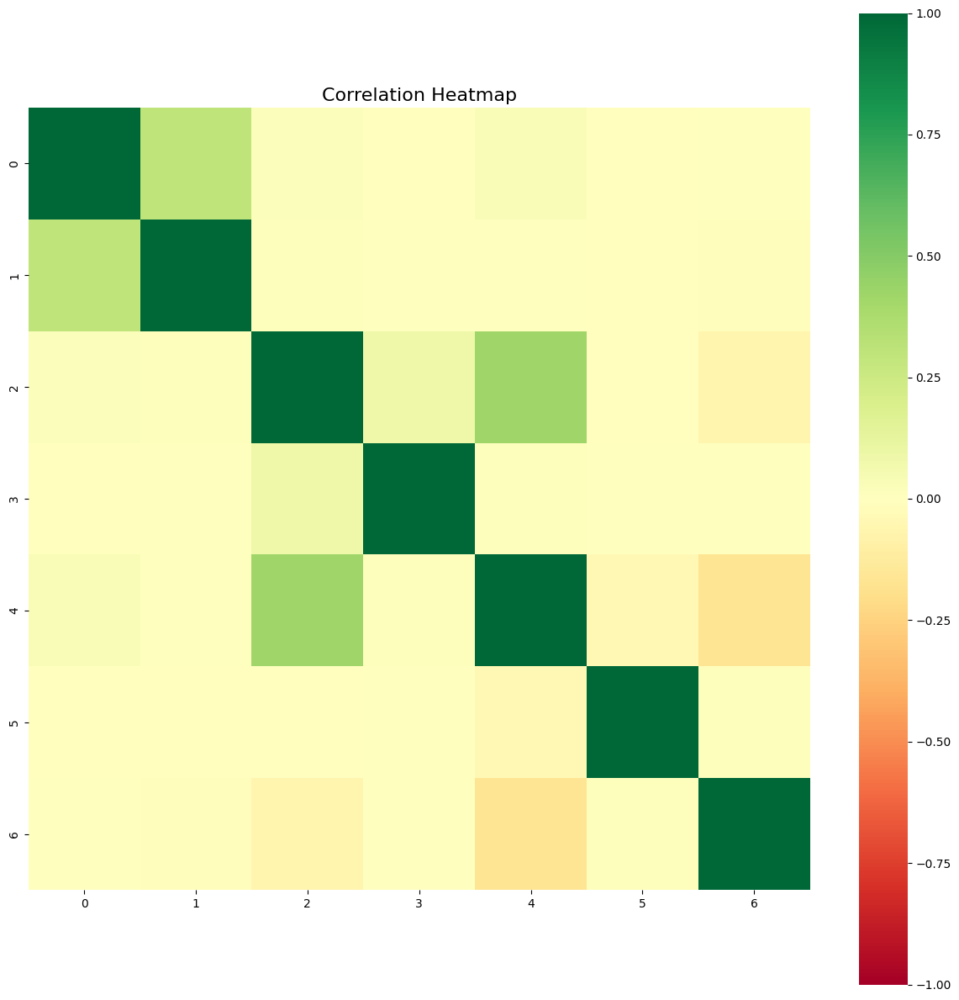

In [62]:
plt.figure(figsize=(15,15))
corr = pd.DataFrame(x_train[:,0:]).corr()
corr.index = pd.DataFrame(x_train[:,0:]).columns
sns.heatmap(corr, cmap='RdYlGn', vmin=-1, vmax=1, square=True)
plt.title("Correlation Heatmap", fontsize=16)
plt.show()

In [29]:
import time
start_time = time.time()
lm_regression = LinearRegression()
lm_regression = lm_regression.fit(x_train, y_train)
end_time = time.time()
lm_time = (end_time - start_time)
print(f"Time taken to train linear regression model : {lm_time} seconds")

Time taken to train linear regression model : 0.9428188800811768 seconds


In [30]:
trips = lm_regression.predict(x_test)
predictions = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': trips.flatten()})


In [31]:
predictions

,Actual,Predicted
0,14.833333,12.860843
1,15.866667,16.037547
2,16.916667,14.563531
3,6.050000,8.126613
4,17.083333,15.995229
...,...,...
1790229,8.116667,8.600785
1790230,9.383333,10.002779
1790231,4.883333,6.136940
1790232,4.116667,5.200233


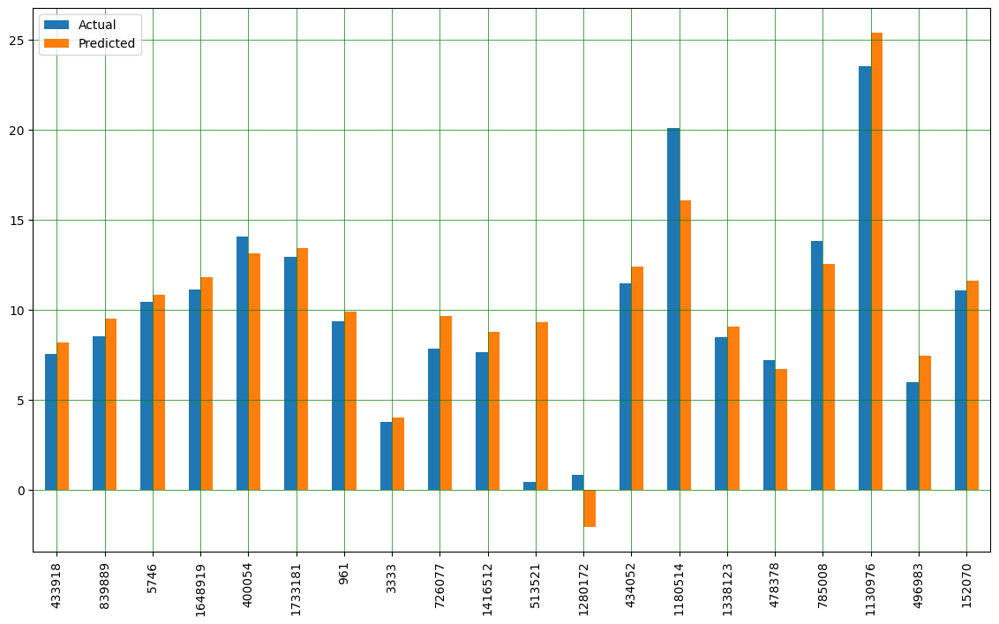

In [66]:
predictions.sample(20).plot(kind='bar',figsize=(14,8))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

In [32]:
lm_score = r2_score(y_test, trips)
print(lm_score)

0.8741384556497722


**Prediction using ada boost**

In [33]:
from sklearn.ensemble import AdaBoostRegressor
start_time = time.time()
regression = AdaBoostRegressor()
regression = regression.fit(x_train, y_train)
end_time = time.time()
ad_time = (end_time - start_time)
print(f"Time taken to train AdaBoost model : {ad_time} seconds")

trips = regression.predict(x_test)

predictions = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': trips.flatten()})
predictions

Time taken to train AdaBoost model : 539.3401939868927 seconds


,Actual,Predicted
0,14.833333,14.980226
1,15.866667,16.701467
2,16.916667,18.331421
3,6.050000,7.355337
4,17.083333,18.112965
...,...,...
1790229,8.116667,10.144172
1790230,9.383333,12.223854
1790231,4.883333,7.014793
1790232,4.116667,6.486558


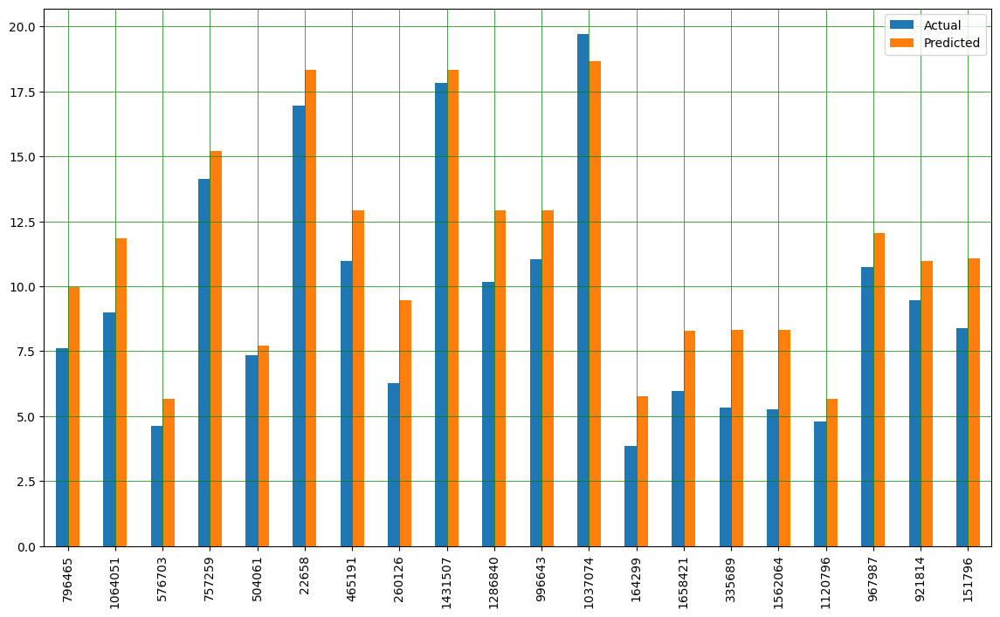

In [69]:
predictions.sample(20).plot(kind='bar',figsize=(14,8))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

In [34]:
ad_score = r2_score(y_test, trips)
print(ad_score)

0.8089190769243764


**Prediction using Decision Tree**

In [35]:
from sklearn.tree import DecisionTreeRegressor
start_time = time.time()
dt_regression = DecisionTreeRegressor()
dt_regression = dt_regression.fit(x_train, y_train)
end_time = time.time()
dt_time = (end_time - start_time)
print(f"Time taken to train Decision tree model : {dt_time} seconds")

Time taken to train Decision tree model : 23.479034900665283 seconds


In [36]:
trips = dt_regression.predict(x_test)
predictions = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': trips.flatten()})
predictions

,Actual,Predicted
0,14.833333,14.833333
1,15.866667,15.866667
2,16.916667,16.916667
3,6.050000,6.050000
4,17.083333,17.083333
...,...,...
1790229,8.116667,8.116667
1790230,9.383333,9.383333
1790231,4.883333,4.883333
1790232,4.116667,4.116667


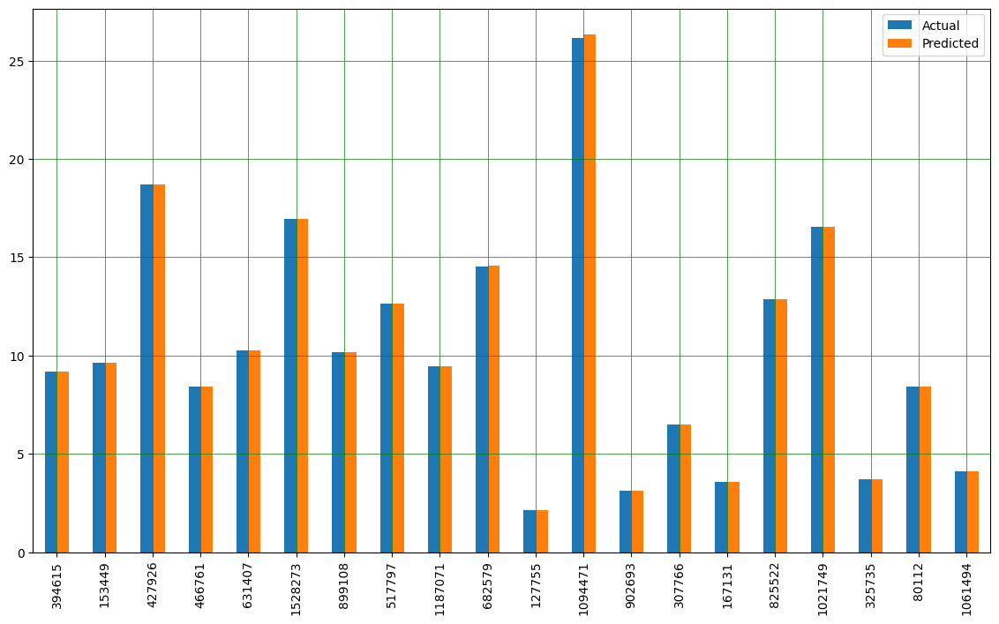

In [74]:
predictions.sample(20).plot(kind='bar',figsize=(14,8))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.show()

In [37]:
dt_score = r2_score(y_test, trips)
print(dt_score)

0.9998621015732585


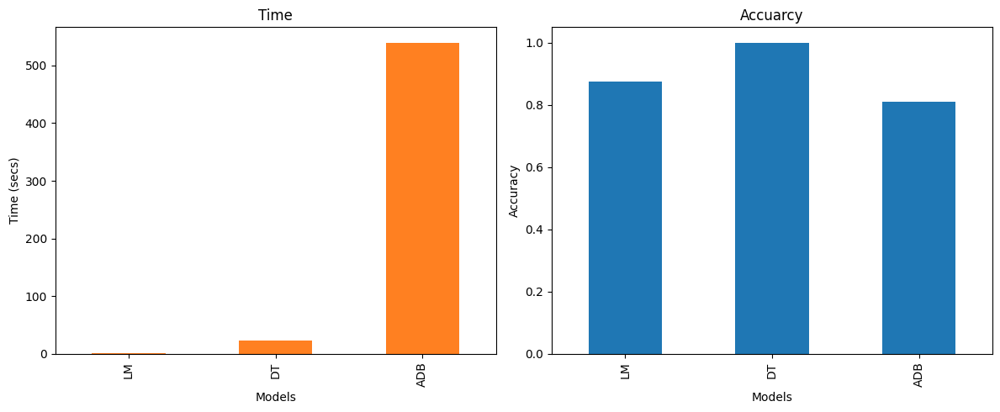

In [38]:
r2 = [lm_score, dt_score,ad_score]
tm = [lm_time, dt_time, ad_time]
comp = pd.DataFrame({'Time': tm, 'Accu': r2})
label = ['LM', 'DT', 'ADB']
fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(12,5))
ax = comp['Time'].plot(kind='bar',title="Time",ax=axes[0],color = (1, 0.5, 0.13))
ax1 = comp['Accu'].plot(kind='bar',title="Accuarcy",ax=axes[1])
ax.set_ylabel("Time (secs)")
ax.set_xlabel('Models')
ax.set_xticklabels(label)
ax1.set_ylabel("Accuracy")
ax1.set_xlabel('Models')
ax1.set_xticklabels(label)
fig.tight_layout()

# Hotspot Analysis


In [42]:
# Filter extreme values for better visualization
df = df[(df['total_amount'] <= 100) & (df['trip_distance'] <= 50)]
# Dash app
app = dash.Dash(__name__)
app.layout = html.Div([
    html.H1("NYC Taxi Hotspot Analysis", style={'textAlign': 'center'}),
    
    dcc.Tabs([
        dcc.Tab(label='Heatmap: Pickup & Dropoff', children=[
            html.Label("Select Cluster Type"),
            dcc.RadioItems(
                id='cluster-type',
                options=[
                    {'label': 'Pickup Clusters', 'value': 'pickup'},
                    {'label': 'Dropoff Clusters', 'value': 'dropoff'}
                ],
                value='pickup',
                inline=True
            ),
            dcc.Graph(id='heatmap'),
        ]),
        
        dcc.Tab(label='Trip Duration Analysis', children=[
            dcc.Dropdown(
                id='day-filter',
                options=[{'label': day, 'value': num} for day, num in zip(
                    ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
                    range(7))
                ],
                value=0,
                clearable=False
            ),
            dcc.Graph(id='trip-duration-plot'),
        ]),
        
        dcc.Tab(label='Fare Analysis', children=[
            dcc.Graph(id='fare-distribution-plot')
        
        ]),
        
    ])
])

@app.callback(
    Output('heatmap', 'figure'),
    Input('cluster-type', 'value')
)
def update_heatmap(cluster_type):
    if cluster_type == 'pickup':
        fig = px.density_mapbox(df, lat='pickup_latitude', lon='pickup_longitude', 
                                radius=10, zoom=10, mapbox_style='open-street-map')
    else:
        fig = px.density_mapbox(df, lat='dropoff_latitude', lon='dropoff_longitude', 
                                radius=10, zoom=10, mapbox_style='open-street-map')
    return fig

@app.callback(
    Output('trip-duration-plot', 'figure'),
    Input('day-filter', 'value')
)
def update_trip_duration(day):
    filtered_df = df[df['weekday_num'] == day]
    fig = px.box(filtered_df, x='pickup_hour', y='trip_duration', title="Trip Duration by Hour")
    return fig

@app.callback(
    Output('fare-distribution-plot', 'figure'),
    Input('day-filter', 'value')
)
def update_fare_distribution(day):
    filtered_df = df[df['weekday_num'] == day]
    fig = px.histogram(filtered_df, x='total_amount', title='Fare Distribution')
    return fig




if __name__ == '__main__':
    app.run_server(debug=True)

/var/folders/62/vblj7kmd3c9cnx5chnxrfj2w0000gn/T/ipykernel_95058/1825624353.py:57: DeprecationWarning:

*density_mapbox* is deprecated! Use *density_map* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

